<a id='top'></a>
<a name="top"></a><!--Need for Colab-->
# Chapter 17 – Representation Learning and Generative Learning Using Autoencoders and GANs

<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/ageron/handson-ml2/blob/master/17_autoencoders_and_gans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
  <td>
    <a target="_blank" href="https://kaggle.com/kernels/welcome?src=https://github.com/ageron/handson-ml2/blob/master/17_autoencoders_and_gans.ipynb"><img src="https://kaggle.com/static/images/open-in-kaggle.svg" /></a>
  </td>
</table>

1. [Setup](#setup)
2. [Efficient Data Representations](#2.0)
3. [Performing PCA with an Undercomplete Linear Autoencoder](#3.0)
4. [Stacked Autoencoders](#4.0)
    * 4.1 [Implementing a Stacked Autoencoder Using Keras](#4.1)
    * 4.2 [Visualizing the Reconstructions](#4.2)
    * 4.3 [Visualizing the Fashion MNIST Dataset](#4.3)
    * 4.4 [Unsupervised Pretraining Using Stacked Autoencoders](#4.4)
    * 4.5 [Tying Weights](#4.5)
    * 4.6 [Training One Autoencoder at a Time](#4.6)
5. [Convolutional Autoencoders](#5.0)
6. [Recurrent Autoencoders](#6.0)
7. [Denoising Autoencoders](#7.0)
8. [Sparse Autoencoders](#8.0)
9. [Variational Autoencoders](#9.0)
    * 9.1 [Generating Fashion MNIST Images](#9.1)
10. [Generative Adversarial Networks](#10.0)
    * 10.1 [The Difficulties of Training GANS](#10.1)
    * 10.2 [Deep Convolutional GANs](#10.2)
    * 10.3 [Progressive Growing of GANS](#10.3)
    * 10.4 [StyleGANS](#10.4)
11. [Extra Material](#11.0)

---
<a id='setup'></a>
<a name="setup"></a>
# 1. Setup
<a href="#top">[back to top]</a>

In [1]:
import sklearn
import tensorflow as tf
from tensorflow import keras
import numpy as np
import os
import pprint
import matplotlib as mpl
import matplotlib.pyplot as plt

# global seed
tf.random.set_seed(42)
pp = pprint.PrettyPrinter(indent=4)

print("Loaded libraries.")

def HR():
    print("-"*40)

Loaded libraries.


A couple utility functions to plot grayscale 28x28 image:

In [2]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

---
<a id='2.0'></a>
<a name="2.0"></a>
# 2. Efficient Data Representations
<a href="#top">[back to top]</a>

No source code

---
<a id='3.0'></a>
<a name="3.0"></a>
# 3. Performing PCA with an Undercomplete Linear Autoencoder
<a href="#top">[back to top]</a>

If the autoencoder uses only linear activations and the cost function is the mean squared error (MSE), then it ends up performing PCA.

The following builds a simple linear autoencoder to perform PCA on a 3D dataset, projecting it to 2D.

Think of autoencoders as a form of self-supervised learning (i.e., using a supervised learning technique with automatically generated labels, in this case simply equal to the inputs).

Epoch 1/20
2/2 - 4s - loss: 0.2547 - 4s/epoch - 2s/step
Epoch 2/20
2/2 - 0s - loss: 0.1032 - 14ms/epoch - 7ms/step
Epoch 3/20
2/2 - 0s - loss: 0.0551 - 13ms/epoch - 7ms/step
Epoch 4/20
2/2 - 0s - loss: 0.0503 - 19ms/epoch - 9ms/step
Epoch 5/20
2/2 - 0s - loss: 0.0839 - 11ms/epoch - 6ms/step
Epoch 6/20
2/2 - 0s - loss: 0.2223 - 23ms/epoch - 11ms/step
Epoch 7/20
2/2 - 0s - loss: 0.0913 - 21ms/epoch - 10ms/step
Epoch 8/20
2/2 - 0s - loss: 0.0320 - 15ms/epoch - 8ms/step
Epoch 9/20
2/2 - 0s - loss: 0.0242 - 13ms/epoch - 7ms/step
Epoch 10/20
2/2 - 0s - loss: 0.0189 - 13ms/epoch - 7ms/step
Epoch 11/20
2/2 - 0s - loss: 0.0142 - 11ms/epoch - 5ms/step
Epoch 12/20
2/2 - 0s - loss: 0.0102 - 21ms/epoch - 10ms/step
Epoch 13/20
2/2 - 0s - loss: 0.0066 - 14ms/epoch - 7ms/step
Epoch 14/20
2/2 - 0s - loss: 0.0056 - 13ms/epoch - 7ms/step
Epoch 15/20
2/2 - 0s - loss: 0.0057 - 15ms/epoch - 8ms/step
Epoch 16/20
2/2 - 0s - loss: 0.0053 - 17ms/epoch - 8ms/step
Epoch 17/20
2/2 - 0s - loss: 0.0050 - 11ms/epoch 

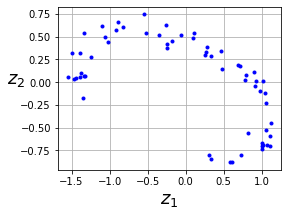

In [3]:
def listing3_0():

    np.random.seed(4)

    def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
        angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
        data = np.empty((m, 3))
        data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
        data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
        data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
        return data

    X_train = generate_3d_data(60)
    X_train = X_train - X_train.mean(axis=0, keepdims=0)

    # Build the Autoencoder
    np.random.seed(42)
    tf.random.set_seed(42)

    encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
    decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
    autoencoder = keras.models.Sequential([encoder, decoder])

    autoencoder.compile(
        loss="mse", 
        optimizer=keras.optimizers.SGD(learning_rate=1.5)
    )

    history = autoencoder.fit(
        X_train, 
        X_train, 
        epochs=20,
        verbose=2
    )

    codings = encoder.predict(X_train)

    fig = plt.figure(figsize=(4,3))
    plt.plot(codings[:,0], codings[:, 1], "b.")
    plt.xlabel("$z_1$", fontsize=18)
    plt.ylabel("$z_2$", fontsize=18, rotation=0)
    plt.grid(True)
    plt.show()

listing3_0()

---
<a id='4.0'></a>
<a name="4.0"></a>
# 4. Stacked Autoencoders
<a href="#top">[back to top]</a>

Build the Autoencoder with MNIST.

In [4]:
from dataclasses import dataclass, field

@dataclass
class DataMNIST:
    X_train: np.ndarray = np.array([])
    X_test: np.ndarray = np.array([])
    X_valid: np.ndarray = np.array([])
    y_train: np.ndarray = np.array([])
    y_valid: np.ndarray = np.array([])
    y_test: np.ndarray = np.array([])

def listing3_0():

    (X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
    X_train_full = X_train_full.astype(np.float32) / 255
    X_test = X_test.astype(np.float32) / 255
    X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
    y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

    return DataMNIST(
        X_train = X_train,
        X_test = X_test,
        X_valid = X_valid,
        y_train = y_train,
        y_valid = y_valid,
        y_test = y_test
    )

data_mnist = listing3_0()

print(type(data_mnist))

4431872/4422102 [==============================] - 0s 0us/step
<class '__main__.DataMNIST'>


<a id='4.1'></a>
<a name="4.1"></a>
## 4.1 Implementing a Stacked Autoencoder Using Keras
<a href="#top">[back to top]</a>

Build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [5]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

In [6]:
def show_reconstructions(model, images=data_mnist.X_valid, n_images=5):
    reconstructions = model.predict(images[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

In [7]:
def listing4_1(data):

    tf.random.set_seed(42)
    np.random.seed(42)

    stacked_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.Dense(30, activation="selu"),
    ])
    
    stacked_decoder = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[30]),
        keras.layers.Dense(28 * 28, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    
    stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
    
    stacked_ae.compile(
        loss="binary_crossentropy",
        optimizer=keras.optimizers.SGD(learning_rate=1.5), 
        metrics=[rounded_accuracy]
        )
    
    history = stacked_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=20,
        validation_data=(data.X_valid, data.X_valid),
        verbose=2
    )

    return stacked_ae, stacked_encoder

model_stacked_ae, stacked_encoder = listing4_1(data_mnist)

Epoch 1/20
1719/1719 - 11s - loss: 0.3381 - rounded_accuracy: 0.8870 - val_loss: 0.3166 - val_rounded_accuracy: 0.9003 - 11s/epoch - 6ms/step
Epoch 2/20
1719/1719 - 7s - loss: 0.3056 - rounded_accuracy: 0.9152 - val_loss: 0.3021 - val_rounded_accuracy: 0.9197 - 7s/epoch - 4ms/step
Epoch 3/20
1719/1719 - 4s - loss: 0.2986 - rounded_accuracy: 0.9215 - val_loss: 0.2982 - val_rounded_accuracy: 0.9206 - 4s/epoch - 3ms/step
Epoch 4/20
1719/1719 - 4s - loss: 0.2948 - rounded_accuracy: 0.9249 - val_loss: 0.2937 - val_rounded_accuracy: 0.9285 - 4s/epoch - 2ms/step
Epoch 5/20
1719/1719 - 4s - loss: 0.2923 - rounded_accuracy: 0.9272 - val_loss: 0.2919 - val_rounded_accuracy: 0.9285 - 4s/epoch - 2ms/step
Epoch 6/20
1719/1719 - 4s - loss: 0.2904 - rounded_accuracy: 0.9289 - val_loss: 0.2915 - val_rounded_accuracy: 0.9306 - 4s/epoch - 2ms/step
Epoch 7/20
1719/1719 - 4s - loss: 0.2890 - rounded_accuracy: 0.9301 - val_loss: 0.2905 - val_rounded_accuracy: 0.9282 - 4s/epoch - 2ms/step
Epoch 8/20
1719/17

<a id='4.2'></a>
<a name="4.2"></a>
## 4.2 Visualizing the Reconstructions
<a href="#top">[back to top]</a>


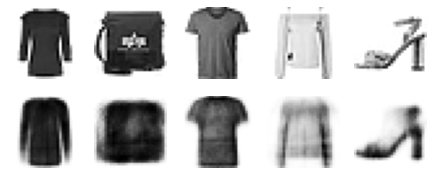

In [8]:
def listing4_2(model_stacked_ae):
    # This function processes a few test images through the autoencoder 
    # and displays the original images and their reconstructions:
    show_reconstructions(model_stacked_ae)

listing4_2(model_stacked_ae)

<a id='4.3'></a>
<a name="4.3"></a>
## 4.3 Visualizing the Fashion MNIST Dataset
<a href="#top">[back to top]</a>

Autoencoders can be used for dimensionality reduction. Another application is for unsupervised pretraining.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


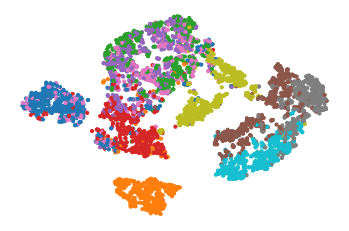

In [9]:
def listing4_3(data, stacked_encoder):

    np.random.seed(42)

    from sklearn.manifold import TSNE

    X_valid_compressed = stacked_encoder.predict(data.X_valid)
    tsne = TSNE()
    X_valid_2D = tsne.fit_transform(X_valid_compressed)
    X_valid_2D = (X_valid_2D - X_valid_2D.min()) / (X_valid_2D.max() - X_valid_2D.min())
    
    ###

    plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=data.y_valid, s=10, cmap="tab10")
    plt.axis("off")
    plt.show()

listing4_3(data_mnist, stacked_encoder)

Let's make this diagram a bit prettier:

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


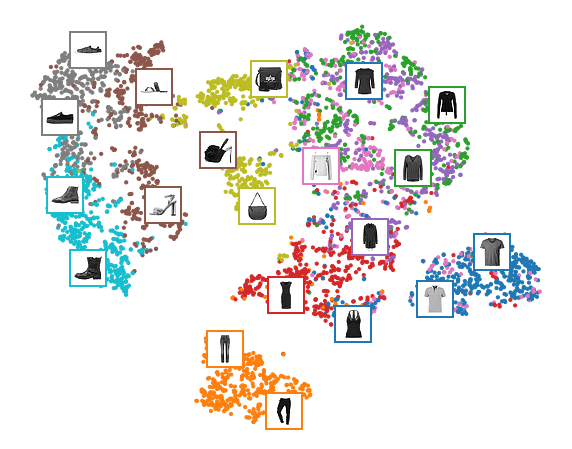

In [10]:
def listing4_3b(data, stacked_encoder):

    from sklearn.manifold import TSNE
    X_valid_compressed = stacked_encoder.predict(data.X_valid)
    tsne = TSNE()
    X_valid_2D = tsne.fit_transform(X_valid_compressed)
    X_valid_2D = (X_valid_2D - X_valid_2D.min()) / (X_valid_2D.max() - X_valid_2D.min())
    

    # Adapted from https://scikit-learn.org/stable/auto_examples/manifold/plot_lle_digits.html
    plt.figure(figsize=(10, 8))
    cmap = plt.cm.tab10
    plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=data.y_valid, s=10, cmap=cmap)
    image_positions = np.array([[1., 1.]])
    for index, position in enumerate(X_valid_2D):
        dist = np.sum((position - image_positions) ** 2, axis=1)
        if np.min(dist) > 0.02: # if far enough from other images
            image_positions = np.r_[image_positions, [position]]
            imagebox = mpl.offsetbox.AnnotationBbox(
                mpl.offsetbox.OffsetImage(data.X_valid[index], cmap="binary"),
                position, bboxprops={"edgecolor": cmap(data.y_valid[index]), "lw": 2})
            plt.gca().add_artist(imagebox)
    
    plt.axis("off")
    plt.show()

listing4_3b(data_mnist, stacked_encoder)

<a id='4.4'></a>
<a name="4.4"></a>
## 4.4 Unsupervised Pretraining Using Stacked Autoencoders
<a href="#top">[back to top]</a>

No source code

<a id='4.5'></a>
<a name="4.5"></a>
## 4.5 Tying weights
<a href="#top">[back to top]</a>

It is common to tie the weights of the encoder and the decoder, by simply using the transpose of the encoder's weights as the decoder weights. For this, we need to use a custom layer.

In [11]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        self.dense = dense
        self.activation = keras.activations.get(activation)
        super().__init__(**kwargs)
    
    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias",
                                      shape=[self.dense.input_shape[-1]],
                                      initializer="zeros")
        super().build(batch_input_shape)
    
    def call(self, inputs):
        z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(z + self.biases)

In [12]:
def listing4_5(data):

    keras.backend.clear_session()
    tf.random.set_seed(42)
    np.random.seed(42)

    dense_1 = keras.layers.Dense(100, activation="selu")
    dense_2 = keras.layers.Dense(30, activation="selu")

    tied_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        dense_1,
        dense_2
    ])

    tied_decoder = keras.models.Sequential([
        DenseTranspose(dense_2, activation="selu"),
        DenseTranspose(dense_1, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])

    tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])

    tied_ae.compile(
        loss="binary_crossentropy",
        optimizer=keras.optimizers.SGD(learning_rate=1.5), 
        metrics=[rounded_accuracy]
    )
    
    history = tied_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=10,
        validation_data=(data.X_valid, data.X_valid)
    )
    
    return tied_ae

model_tied_ae = listing4_5(data_mnist)

Epoch 1/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3269 - rounded_accuracy: 0.8960 - val_loss: 0.3081 - val_rounded_accuracy: 0.9079
Epoch 2/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2975 - rounded_accuracy: 0.9223 - val_loss: 0.2950 - val_rounded_accuracy: 0.9285
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2920 - rounded_accuracy: 0.9274 - val_loss: 0.3024 - val_rounded_accuracy: 0.9075
Epoch 4/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2889 - rounded_accuracy: 0.9302 - val_loss: 0.2880 - val_rounded_accuracy: 0.9333
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2865 - rounded_accuracy: 0.9325 - val_loss: 0.2874 - val_rounded_accuracy: 0.9313
Epoch 6/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2850 - rounded_accuracy: 0.9340 - val_loss: 0.2862 - val_rounded_accuracy: 0.9353
Epoch 7/10
1719/1719 [==================

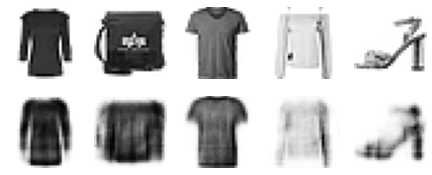

In [13]:
def listing4_5b(model_tied_ae):
    show_reconstructions(model_tied_ae)
    plt.show()
    
listing4_5b(model_tied_ae)

<a id='4.6'></a>
<a name="4.6"></a>
## 4.6 Training one Autoencoder at a Time
<a href="#top">[back to top]</a>

In [14]:
def train_autoencoder(n_neurons, X_train, X_valid, loss, optimizer,
                      n_epochs=10, output_activation=None, metrics=None):
    n_inputs = X_train.shape[-1]
    encoder = keras.models.Sequential([
        keras.layers.Dense(n_neurons, activation="selu", input_shape=[n_inputs])
    ])
    decoder = keras.models.Sequential([
        keras.layers.Dense(n_inputs, activation=output_activation),
    ])
    autoencoder = keras.models.Sequential([encoder, decoder])
    autoencoder.compile(optimizer, loss, metrics=metrics)
    autoencoder.fit(X_train, X_train, epochs=n_epochs,
                    validation_data=(X_valid, X_valid))
    return encoder, decoder, encoder(X_train), encoder(X_valid)

Epoch 1/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3445 - rounded_accuracy: 0.8874 - val_loss: 0.3123 - val_rounded_accuracy: 0.9146
Epoch 2/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3039 - rounded_accuracy: 0.9203 - val_loss: 0.3006 - val_rounded_accuracy: 0.9246
Epoch 3/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2949 - rounded_accuracy: 0.9286 - val_loss: 0.2934 - val_rounded_accuracy: 0.9317
Epoch 4/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2891 - rounded_accuracy: 0.9342 - val_loss: 0.2888 - val_rounded_accuracy: 0.9363
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2853 - rounded_accuracy: 0.9378 - val_loss: 0.2857 - val_rounded_accuracy: 0.9392
Epoch 6/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2827 - rounded_accuracy: 0.9403 - val_loss: 0.2834 - val_rounded_accuracy: 0.9409
Epoch 7/10
1719/1719 [==================

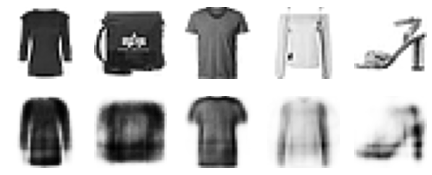

Epoch 1/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.2867 - rounded_accuracy: 0.9343 - val_loss: 0.2883 - val_rounded_accuracy: 0.9341
Epoch 2/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2863 - rounded_accuracy: 0.9347 - val_loss: 0.2881 - val_rounded_accuracy: 0.9347
Epoch 3/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.2861 - rounded_accuracy: 0.9349 - val_loss: 0.2879 - val_rounded_accuracy: 0.9347
Epoch 4/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.2859 - rounded_accuracy: 0.9351 - val_loss: 0.2877 - val_rounded_accuracy: 0.9349
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2858 - rounded_accuracy: 0.9353 - val_loss: 0.2876 - val_rounded_accuracy: 0.9351
Epoch 6/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2857 - rounded_accuracy: 0.9354 - val_loss: 0.2874 - val_rounded_accuracy: 0.9350
Epoch 7/10
1719/1719 [==================

In [15]:
def listing4_6(data):
    tf.random.set_seed(42)
    np.random.seed(42)

    K = keras.backend
    
    X_train_flat = K.batch_flatten(data.X_train) # equivalent to .reshape(-1, 28 * 28)
    X_valid_flat = K.batch_flatten(data.X_valid)
    
    enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
        100, 
        X_train_flat, 
        X_valid_flat, 
        "binary_crossentropy",
        keras.optimizers.SGD(learning_rate=1.5), 
        output_activation="sigmoid",
        metrics=[rounded_accuracy]
    )
    
    enc2, dec2, _, _ = train_autoencoder(
        30, 
        X_train_enc1, 
        X_valid_enc1, 
        "mse", 
        keras.optimizers.SGD(learning_rate=0.05),
        output_activation="selu"
    )

    stacked_ae_1_by_1 = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        enc1, enc2, dec2, dec1,
        keras.layers.Reshape([28, 28])
    ])

    show_reconstructions(stacked_ae_1_by_1)
    plt.show()

    stacked_ae_1_by_1.compile(
        loss="binary_crossentropy",
        optimizer=keras.optimizers.SGD(learning_rate=0.1), 
        metrics=[rounded_accuracy]
    )
    
    history = stacked_ae_1_by_1.fit(
        data.X_train, 
        data.X_train, 
        epochs=10,
        validation_data=(data.X_valid, data.X_valid)
    )

    return stacked_ae_1_by_1

stacked_ae_1_by_1 = listing4_6(data_mnist)

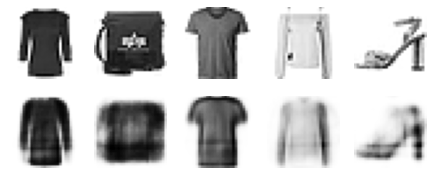

In [16]:
def listing4_6b(stacked_ae_1_by_1):
    show_reconstructions(stacked_ae_1_by_1)
    plt.show()

listing4_6b(stacked_ae_1_by_1)

---
<a id='5.0'></a>
<a name="5.0"></a>
# 5. Convolutional Autoencoders
<a href="#top">[back to top]</a>


Using Convolutional Layers Instead of Dense Layers.

Build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders).

In [17]:
def listing5_0(data):

    tf.random.set_seed(42)
    np.random.seed(42)

    conv_encoder = keras.models.Sequential([
        keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
        keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
        keras.layers.MaxPool2D(pool_size=2),
        keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
        keras.layers.MaxPool2D(pool_size=2),
        keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
        keras.layers.MaxPool2D(pool_size=2)
    ])
    conv_decoder = keras.models.Sequential([
        keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="VALID", activation="selu", input_shape=[3, 3, 64]),
        keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="SAME", activation="selu"),
        keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="SAME", activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    conv_ae = keras.models.Sequential([conv_encoder, conv_decoder])

    conv_ae.compile(
        loss="binary_crossentropy", 
        optimizer=keras.optimizers.SGD(learning_rate=1.0),
        metrics=[rounded_accuracy]
    )

    history = conv_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=5,
        validation_data=(data.X_valid, data.X_valid)
    )
    
    conv_encoder.summary()
    conv_decoder.summary()

    return conv_ae

model_conv_ae = listing5_0(data_mnist)

Epoch 1/5
1719/1719 [==============================] - 18s 5ms/step - loss: 0.3018 - rounded_accuracy: 0.9187 - val_loss: 0.2845 - val_rounded_accuracy: 0.9295
Epoch 2/5
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2756 - rounded_accuracy: 0.9413 - val_loss: 0.2729 - val_rounded_accuracy: 0.9455
Epoch 3/5
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2708 - rounded_accuracy: 0.9462 - val_loss: 0.2696 - val_rounded_accuracy: 0.9497
Epoch 4/5
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2682 - rounded_accuracy: 0.9490 - val_loss: 0.2685 - val_rounded_accuracy: 0.9493
Epoch 5/5
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2664 - rounded_accuracy: 0.9509 - val_loss: 0.2671 - val_rounded_accuracy: 0.9508
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_2 (Reshape)         (None, 28, 28, 1)   

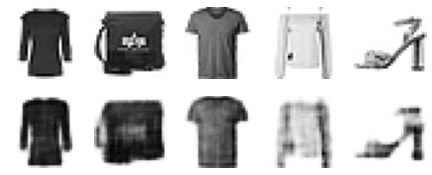

In [18]:
def listing5_0b(model_conv_ae):

    show_reconstructions(model_conv_ae)
    plt.show()

listing5_0b(model_conv_ae)

---
<a id='6.0'></a>
<a name="6.0"></a>
# 6. Recurrent Autoencoders
<a href="#top">[back to top]</a>

If you want to build an autoencoder for sequences, such as time series or text (e.g., for unsupervised learning or dimensionality reduction), then recurrent neural networks may be better suited than dense networks.

Building a recurrent autoencoder is straightforward: the encoder is typically a sequence-to-vector RNN which compresses the input sequence down to a single vector. The decoder is a vector-to-sequence RNN that does the reverse:

In [19]:
def listing6_0(data):

    recurrent_encoder = keras.models.Sequential([
        keras.layers.LSTM(100, return_sequences=True, input_shape=[28, 28]),
        keras.layers.LSTM(30)
    ])
    recurrent_decoder = keras.models.Sequential([
        keras.layers.RepeatVector(28, input_shape=[30]),
        keras.layers.LSTM(100, return_sequences=True),
        keras.layers.TimeDistributed(keras.layers.Dense(28, activation="sigmoid"))
    ])
    
    recurrent_ae = keras.models.Sequential([recurrent_encoder, recurrent_decoder])
    
    recurrent_ae.compile(
        loss="binary_crossentropy", 
        optimizer=keras.optimizers.SGD(0.1),
        metrics=[rounded_accuracy]
    )
    
    history = recurrent_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=10, 
        validation_data=(data.X_valid, data.X_valid)
    )
    
    return recurrent_ae

model_recurrent_ae = listing6_0(data_mnist)

Epoch 1/10
1719/1719 [==============================] - 22s 10ms/step - loss: 0.5192 - rounded_accuracy: 0.7492 - val_loss: 0.4581 - val_rounded_accuracy: 0.8081
Epoch 2/10
1719/1719 [==============================] - 17s 10ms/step - loss: 0.4050 - rounded_accuracy: 0.8432 - val_loss: 0.3743 - val_rounded_accuracy: 0.8690
Epoch 3/10
1719/1719 [==============================] - 16s 9ms/step - loss: 0.3653 - rounded_accuracy: 0.8710 - val_loss: 0.3604 - val_rounded_accuracy: 0.8767
Epoch 4/10
1719/1719 [==============================] - 16s 9ms/step - loss: 0.3507 - rounded_accuracy: 0.8809 - val_loss: 0.3526 - val_rounded_accuracy: 0.8771
Epoch 5/10
1719/1719 [==============================] - 16s 9ms/step - loss: 0.3405 - rounded_accuracy: 0.8875 - val_loss: 0.3362 - val_rounded_accuracy: 0.8918
Epoch 6/10
1719/1719 [==============================] - 16s 9ms/step - loss: 0.3335 - rounded_accuracy: 0.8922 - val_loss: 0.3306 - val_rounded_accuracy: 0.8966
Epoch 7/10
1719/1719 [==========

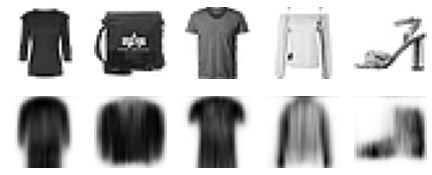

In [20]:
def listing6_0b(model_recurrent_ae):

    show_reconstructions(model_recurrent_ae)
    plt.show()

listing6_0b(model_recurrent_ae)

---
<a id='7.0'></a>
<a name="7.0"></a>
# 7. Denoising Autoencoders
<a href="#top">[back to top]</a>

<a id='7.1'></a>
<a name="7.1"></a>
## 7.1 Denoising Autoencoders, Gaussian noise
<a href="#top">[back to top]</a>

Epoch 1/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3500 - rounded_accuracy: 0.8773 - val_loss: 0.3166 - val_rounded_accuracy: 0.9078
Epoch 2/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3120 - rounded_accuracy: 0.9097 - val_loss: 0.3089 - val_rounded_accuracy: 0.9153
Epoch 3/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3060 - rounded_accuracy: 0.9148 - val_loss: 0.3033 - val_rounded_accuracy: 0.9179
Epoch 4/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3025 - rounded_accuracy: 0.9179 - val_loss: 0.2999 - val_rounded_accuracy: 0.9218
Epoch 5/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.2996 - rounded_accuracy: 0.9205 - val_loss: 0.2973 - val_rounded_accuracy: 0.9237
Epoch 6/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.2974 - rounded_accuracy: 0.9223 - val_loss: 0.2959 - val_rounded_accuracy: 0.9267
Epoch 7/10
1719/1719 [==================

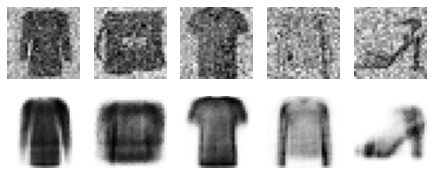

In [21]:
def listing7_1(data):

    tf.random.set_seed(42)
    np.random.seed(42)

    denoising_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        keras.layers.GaussianNoise(0.2),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.Dense(30, activation="selu")
    ])
    denoising_decoder = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[30]),
        keras.layers.Dense(28 * 28, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    
    denoising_ae = keras.models.Sequential([denoising_encoder, denoising_decoder])
    
    denoising_ae.compile(
        loss="binary_crossentropy", 
        optimizer=keras.optimizers.SGD(learning_rate=1.0),
        metrics=[rounded_accuracy]
    )
    
    history = denoising_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=10,
        validation_data=(data.X_valid, data.X_valid)
    )

    tf.random.set_seed(42)
    np.random.seed(42)

    noise = keras.layers.GaussianNoise(0.2)
    show_reconstructions(denoising_ae, noise(data.X_valid, training=True))
    plt.show()

listing7_1(data_mnist)

<a id='7.2'></a>
<a name="7.2"></a>
## 7.2 Denoising Autoencoders, Using dropout
<a href="#top">[back to top]</a>

Epoch 1/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3568 - rounded_accuracy: 0.8710 - val_loss: 0.3200 - val_rounded_accuracy: 0.9041
Epoch 2/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3182 - rounded_accuracy: 0.9032 - val_loss: 0.3125 - val_rounded_accuracy: 0.9110
Epoch 3/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3128 - rounded_accuracy: 0.9075 - val_loss: 0.3075 - val_rounded_accuracy: 0.9153
Epoch 4/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3092 - rounded_accuracy: 0.9102 - val_loss: 0.3041 - val_rounded_accuracy: 0.9178
Epoch 5/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3067 - rounded_accuracy: 0.9123 - val_loss: 0.3015 - val_rounded_accuracy: 0.9193
Epoch 6/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3048 - rounded_accuracy: 0.9139 - val_loss: 0.3014 - val_rounded_accuracy: 0.9172
Epoch 7/10
1719/1719 [==================

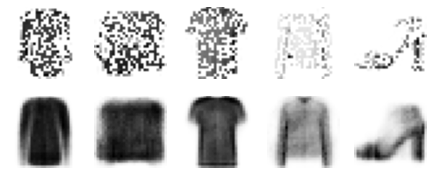

In [22]:
def listing7_2(data):

    # Using dropout:
    tf.random.set_seed(42)
    np.random.seed(42)

    dropout_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.Dense(30, activation="selu")
    ])
    dropout_decoder = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[30]),
        keras.layers.Dense(28 * 28, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    
    dropout_ae = keras.models.Sequential([dropout_encoder, dropout_decoder])
    
    dropout_ae.compile(
        loss="binary_crossentropy", 
        optimizer=keras.optimizers.SGD(learning_rate=1.0),
        metrics=[rounded_accuracy]
    )
    
    history = dropout_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=10,
        validation_data=(data.X_valid, data.X_valid)
    )
    
    tf.random.set_seed(42)
    np.random.seed(42)

    dropout = keras.layers.Dropout(0.5)
    show_reconstructions(dropout_ae, dropout(data.X_valid, training=True))

listing7_2(data_mnist)

---
<a id='8.0'></a>
<a name="8.0"></a>
# 8. Sparse Autoencoder
<a href="#top">[back to top]</a>

<a id='8.1'></a>
<a name="8.1"></a>
## 8.1 Simple Stacked Autoencoder
<a href="#top">[back to top]</a>

Let's build a simple stacked autoencoder, so we can compare it to the sparse autoencoders we will build. This time we will use the sigmoid activation function for the coding layer, to ensure that the coding values range from 0 to 1:

Epoch 1/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.4329 - rounded_accuracy: 0.7950 - val_loss: 0.3773 - val_rounded_accuracy: 0.8492
Epoch 2/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3612 - rounded_accuracy: 0.8668 - val_loss: 0.3514 - val_rounded_accuracy: 0.8797
Epoch 3/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3410 - rounded_accuracy: 0.8852 - val_loss: 0.3367 - val_rounded_accuracy: 0.8912
Epoch 4/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3288 - rounded_accuracy: 0.8954 - val_loss: 0.3263 - val_rounded_accuracy: 0.8991
Epoch 5/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3213 - rounded_accuracy: 0.9011 - val_loss: 0.3210 - val_rounded_accuracy: 0.9032
Epoch 6/10
1719/1719 [==============================] - 5s 3ms/step - loss: 0.3176 - rounded_accuracy: 0.9038 - val_loss: 0.3179 - val_rounded_accuracy: 0.9050
Epoch 7/10
1719/1719 [==================

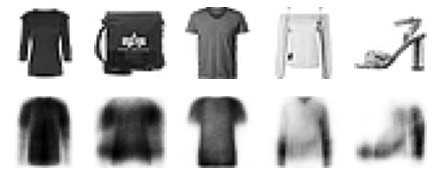

In [23]:
def listing8_1(data):
        
    tf.random.set_seed(42)
    np.random.seed(42)

    simple_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.Dense(30, activation="sigmoid"),
    ])
    simple_decoder = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[30]),
        keras.layers.Dense(28 * 28, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    
    simple_ae = keras.models.Sequential([simple_encoder, simple_decoder])
    
    simple_ae.compile(
        loss="binary_crossentropy", 
        optimizer=keras.optimizers.SGD(learning_rate=1.),
        metrics=[rounded_accuracy]
    )
    
    history = simple_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=10,
        validation_data=(data.X_valid, data.X_valid)
    )
    
    show_reconstructions(simple_ae)
    plt.show()

    return simple_encoder

simple_encoder = listing8_1(data_mnist)

Let's create a couple functions to print nice activation histograms:

In [24]:
def plot_percent_hist(ax, data, bins):
    counts, _ = np.histogram(data, bins=bins)
    widths = bins[1:] - bins[:-1]
    x = bins[:-1] + widths / 2
    ax.bar(x, counts / len(data), width=widths*0.8)
    ax.xaxis.set_ticks(bins)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(
        lambda y, position: "{}%".format(int(np.round(100 * y)))))
    ax.grid(True)

In [25]:
def plot_activations_histogram(encoder, height=1, n_bins=10):
    X_valid_codings = encoder(data_mnist.X_valid).numpy()
    activation_means = X_valid_codings.mean(axis=0)
    mean = activation_means.mean()
    bins = np.linspace(0, 1, n_bins + 1)

    fig, [ax1, ax2] = plt.subplots(figsize=(10, 3), nrows=1, ncols=2, sharey=True)
    
    plot_percent_hist(ax1, X_valid_codings.ravel(), bins)
    ax1.plot([mean, mean], [0, height], "k--", label="Overall Mean = {:.2f}".format(mean))
    ax1.legend(loc="upper center", fontsize=14)
    ax1.set_xlabel("Activation")
    ax1.set_ylabel("% Activations")
    ax1.axis([0, 1, 0, height])
    
    plot_percent_hist(ax2, activation_means, bins)
    ax2.plot([mean, mean], [0, height], "k--")
    ax2.set_xlabel("Neuron Mean Activation")
    ax2.set_ylabel("% Neurons")
    ax2.axis([0, 1, 0, height])

Let's use these functions to plot histograms of the activations of the encoding layer. The histogram on the left shows the distribution of all the activations. You can see that values close to 0 or 1 are more frequent overall, which is consistent with the saturating nature of the sigmoid function. The histogram on the right shows the distribution of mean neuron activations: you can see that most neurons have a mean activation close to 0.5. Both histograms tell us that each neuron tends to either fire close to 0 or 1, with about 50% probability each. However, some neurons fire almost all the time (right side of the right histogram).

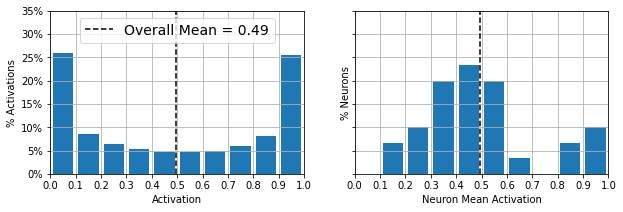

In [26]:
plot_activations_histogram(simple_encoder, height=0.35)
plt.show()

<a id='8.2'></a>
<a name="8.2"></a>
## 8.2 Simple Stacked Autoencoder with $\ell_1$ Regularization
<a href="#top">[back to top]</a>

Now let's add $\ell_1$ regularization to the coding layer.

This layer just returns its inputs, but as a side effect it adds a training loss equal to the sum of absolute values of its inputs (this layer only has an effect during training).

Equivalently, you
could remove the layer and set  `activity_regularizer=keras.regularizers.l1(1e-3)` to the previous layer.

Epoch 1/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.4310 - rounded_accuracy: 0.8129 - val_loss: 0.3808 - val_rounded_accuracy: 0.8555
Epoch 2/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.3690 - rounded_accuracy: 0.8689 - val_loss: 0.3638 - val_rounded_accuracy: 0.8741
Epoch 3/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.3545 - rounded_accuracy: 0.8799 - val_loss: 0.3502 - val_rounded_accuracy: 0.8857
Epoch 4/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.3437 - rounded_accuracy: 0.8876 - val_loss: 0.3418 - val_rounded_accuracy: 0.8898
Epoch 5/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.3372 - rounded_accuracy: 0.8920 - val_loss: 0.3368 - val_rounded_accuracy: 0.8949
Epoch 6/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.3320 - rounded_accuracy: 0.8968 - val_loss: 0.3316 - val_rounded_accuracy: 0.8992
Epoch 7/10
1719/1719 [==================

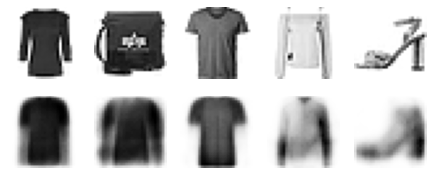

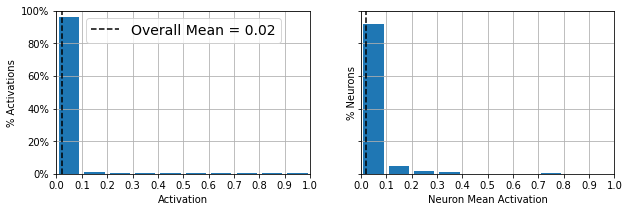

In [27]:
def listing8_2(data):
        
    tf.random.set_seed(42)
    np.random.seed(42)

    sparse_l1_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.Dense(300, activation="sigmoid"),
        # Alternatively, you could add
        # activity_regularizer=keras.regularizers.l1(1e-3)
        # to the previous layer.
        keras.layers.ActivityRegularization(l1=1e-3)  
    ])
    sparse_l1_decoder = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[300]),
        keras.layers.Dense(28 * 28, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    
    sparse_l1_ae = keras.models.Sequential([sparse_l1_encoder, sparse_l1_decoder])
    
    sparse_l1_ae.compile(
        loss="binary_crossentropy", 
        optimizer=keras.optimizers.SGD(learning_rate=1.0),
        metrics=[rounded_accuracy]
        )
    
    history = sparse_l1_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=10,
        validation_data=(data.X_valid, data.X_valid)
    )

    show_reconstructions(sparse_l1_ae)
    plot_activations_histogram(sparse_l1_encoder, height=1.)
    plt.show()

listing8_2(data_mnist)

Let's use the KL Divergence loss instead to ensure sparsity, and target 10% sparsity rather than 0%:

(0.0, 1.0, 0.0, 0.95)

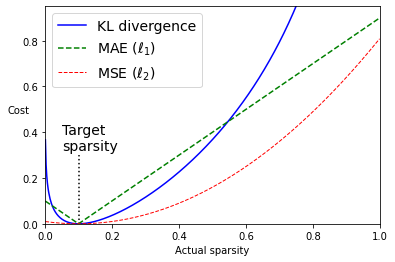

In [28]:
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q)**2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])

In [29]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target
    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

<a id='8.3'></a>
<a name="8.3"></a>
## 8.3 Sparse Autoencoder with KLDivergenceRegularizer
<a href="#top">[back to top]</a>

Use KLDivergenceRegularizer for the coding layer's activations.

Epoch 1/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.4150 - rounded_accuracy: 0.8121 - val_loss: 0.3716 - val_rounded_accuracy: 0.8564
Epoch 2/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.3531 - rounded_accuracy: 0.8763 - val_loss: 0.3442 - val_rounded_accuracy: 0.8847
Epoch 3/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3340 - rounded_accuracy: 0.8918 - val_loss: 0.3293 - val_rounded_accuracy: 0.8975
Epoch 4/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3224 - rounded_accuracy: 0.9018 - val_loss: 0.3213 - val_rounded_accuracy: 0.9043
Epoch 5/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3169 - rounded_accuracy: 0.9063 - val_loss: 0.3171 - val_rounded_accuracy: 0.9078
Epoch 6/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3135 - rounded_accuracy: 0.9093 - val_loss: 0.3140 - val_rounded_accuracy: 0.9105
Epoch 7/10
1719/1719 [==================

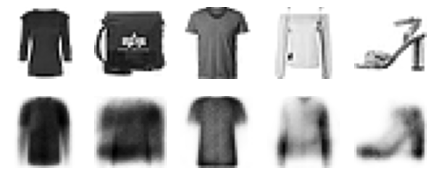

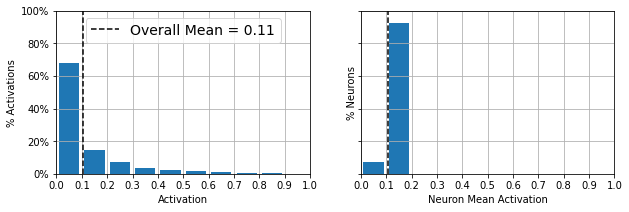

In [30]:
def listing8_3(data):

    tf.random.set_seed(42)
    np.random.seed(42)

    kld_reg = KLDivergenceRegularizer(weight=0.05, target=0.1)
    sparse_kl_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.Dense(300, activation="sigmoid", activity_regularizer=kld_reg)
    ])
    sparse_kl_decoder = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[300]),
        keras.layers.Dense(28 * 28, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    
    sparse_kl_ae = keras.models.Sequential([sparse_kl_encoder, sparse_kl_decoder])
    
    sparse_kl_ae.compile(
        loss="binary_crossentropy", 
        optimizer=keras.optimizers.SGD(learning_rate=1.0),
        metrics=[rounded_accuracy]
    )
    
    history = sparse_kl_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=10,
        validation_data=(data.X_valid, data.X_valid)
    )
    
    show_reconstructions(sparse_kl_ae)
    plot_activations_histogram(sparse_kl_encoder)
    plt.show()

listing8_3(data_mnist)

---
<a id='9.0'></a>
<a name="9.0"></a>
# 9. Variational Autoencoder
<a href="#top">[back to top]</a>

In [31]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean 

Epoch 1/25
430/430 [==============================] - 4s 6ms/step - loss: 0.3894 - rounded_accuracy: 0.8614 - val_loss: 0.3463 - val_rounded_accuracy: 0.9009
Epoch 2/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3425 - rounded_accuracy: 0.8981 - val_loss: 0.3438 - val_rounded_accuracy: 0.9018
Epoch 3/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3327 - rounded_accuracy: 0.9053 - val_loss: 0.3308 - val_rounded_accuracy: 0.9096
Epoch 4/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3279 - rounded_accuracy: 0.9092 - val_loss: 0.3295 - val_rounded_accuracy: 0.9099
Epoch 5/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3247 - rounded_accuracy: 0.9118 - val_loss: 0.3277 - val_rounded_accuracy: 0.9113
Epoch 6/25
430/430 [==============================] - 3s 7ms/step - loss: 0.3225 - rounded_accuracy: 0.9137 - val_loss: 0.3262 - val_rounded_accuracy: 0.9114
Epoch 7/25
430/430 [==============================] 

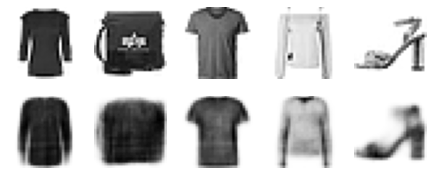

In [32]:
def listing9_0(data):
    tf.random.set_seed(42)
    np.random.seed(42)

    codings_size = 10

    inputs = keras.layers.Input(shape=[28, 28])
    z = keras.layers.Flatten()(inputs)
    z = keras.layers.Dense(150, activation="selu")(z)
    z = keras.layers.Dense(100, activation="selu")(z)
    codings_mean = keras.layers.Dense(codings_size)(z)
    codings_log_var = keras.layers.Dense(codings_size)(z)
    codings = Sampling()([codings_mean, codings_log_var])
    variational_encoder = keras.models.Model(
        inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

    decoder_inputs = keras.layers.Input(shape=[codings_size])
    x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
    x = keras.layers.Dense(150, activation="selu")(x)
    x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
    outputs = keras.layers.Reshape([28, 28])(x)
    
    variational_decoder = keras.models.Model(inputs=[decoder_inputs], outputs=[outputs])

    _, _, codings = variational_encoder(inputs)
    reconstructions = variational_decoder(codings)
    variational_ae = keras.models.Model(inputs=[inputs], outputs=[reconstructions])

    latent_loss = -0.5 * K.sum(
        1 + codings_log_var - K.exp(codings_log_var) - K.square(codings_mean),
        axis=-1)
    
    variational_ae.add_loss(K.mean(latent_loss) / 784.)
    
    variational_ae.compile(
        loss="binary_crossentropy", 
        optimizer="rmsprop", 
        metrics=[rounded_accuracy]
    )
    
    history = variational_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=25, 
        batch_size=128,
        validation_data=(data.X_valid, data.X_valid)
    )
    
    show_reconstructions(variational_ae)
    plt.show()

    return variational_decoder

variational_decoder = listing9_0(data_mnist)

<a id='9.1'></a>
<a name="9.1"></a>
## 9.1 Generating Fashion MNIST Images
<a href="#top">[back to top]</a>

In [33]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

Let's generate a few random codings, decode them and plot the resulting images:

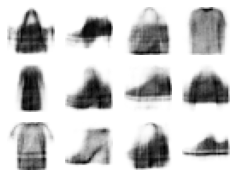

In [34]:
def listing9_1(variational_decoder):
        
    tf.random.set_seed(42)

    codings_size = 10
    codings = tf.random.normal(shape=[12, codings_size])

    images = variational_decoder(codings).numpy()
    plot_multiple_images(images, 4)
    plt.show()

listing9_1(variational_decoder)

Perform semantic interpolation between these images:

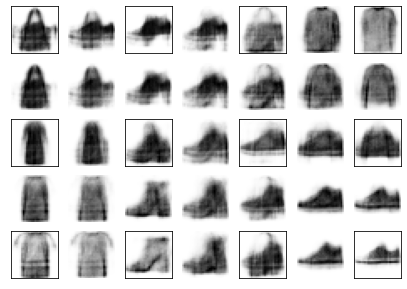

In [35]:
def listing9_2(variational_decoder):
        
    tf.random.set_seed(42)
    np.random.seed(42)

    codings_size = 10
    codings = tf.random.normal(shape=[12, codings_size])

    codings_grid = tf.reshape(codings, [1, 3, 4, codings_size])
    larger_grid = tf.image.resize(codings_grid, size=[5, 7])
    interpolated_codings = tf.reshape(larger_grid, [-1, codings_size])
    images = variational_decoder(interpolated_codings).numpy()

    plt.figure(figsize=(7, 5))
    for index, image in enumerate(images):
        plt.subplot(5, 7, index + 1)
        if index%7%2==0 and index//7%2==0:
            plt.gca().get_xaxis().set_visible(False)
            plt.gca().get_yaxis().set_visible(False)
        else:
            plt.axis("off")
        plt.imshow(image, cmap="binary")

    plt.show()

listing9_2(variational_decoder)

---
<a id='10.0'></a>
<a name="10.0"></a>
# 10. Generative Adversarial Networks
<a href="#top">[back to top]</a>

In [36]:
# Training loop for GAN
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))              # not shown in the book
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)                     # not shown
        plt.show()                                                    # not shown

Epoch 1/1


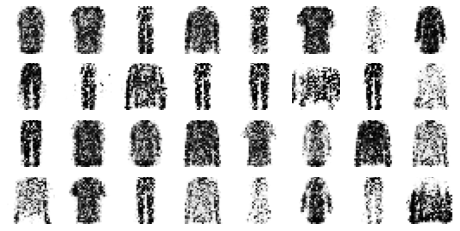

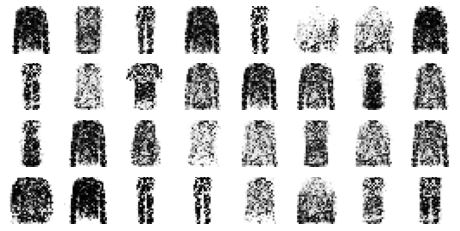

Epoch 1/50


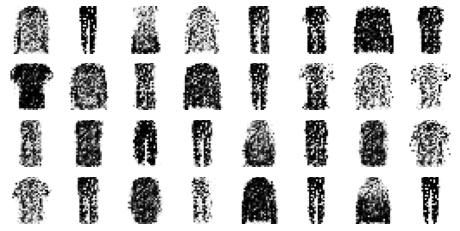

Epoch 2/50


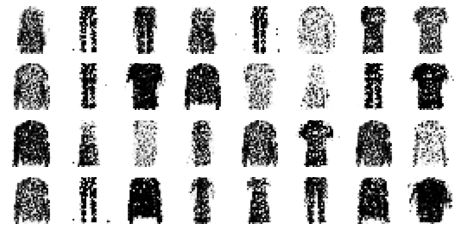

Epoch 3/50


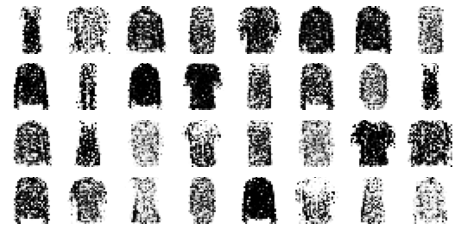

Epoch 4/50


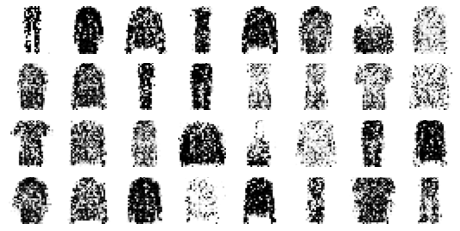

Epoch 5/50


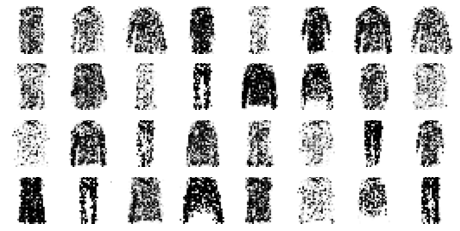

Epoch 6/50


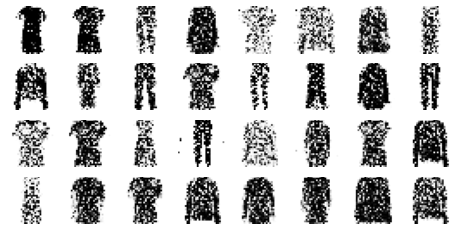

Epoch 7/50


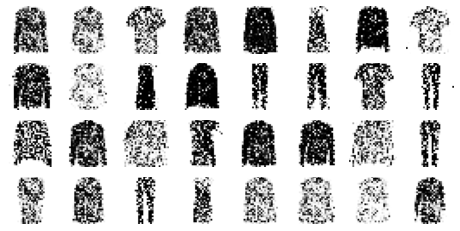

Epoch 8/50


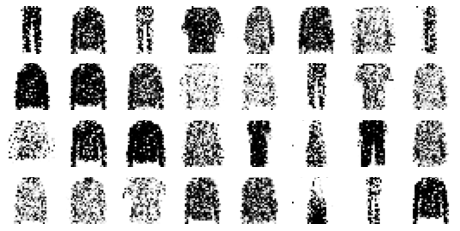

Epoch 9/50


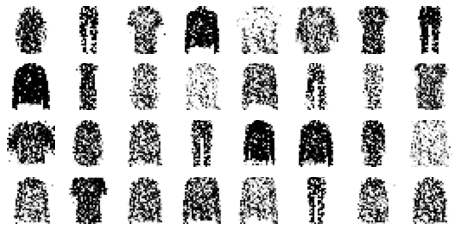

Epoch 10/50


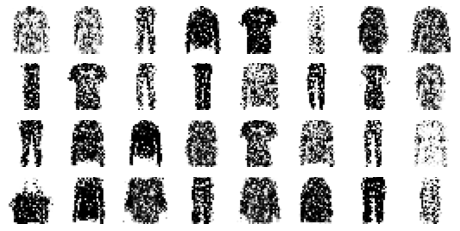

Epoch 11/50


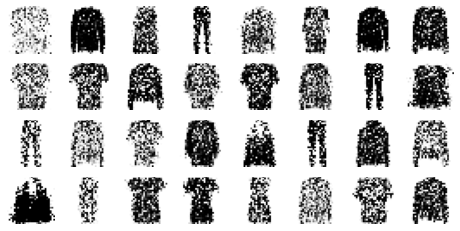

Epoch 12/50


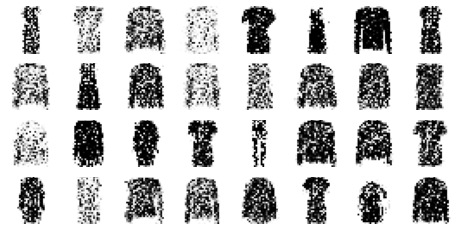

Epoch 13/50


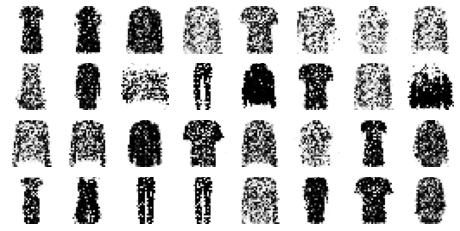

Epoch 14/50


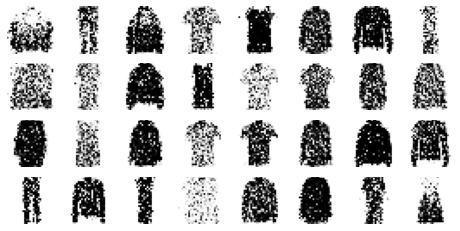

Epoch 15/50


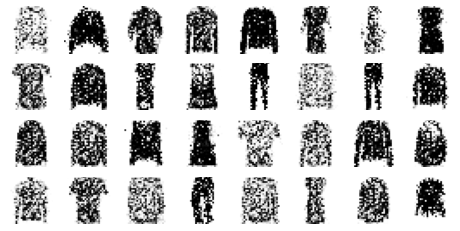

Epoch 16/50


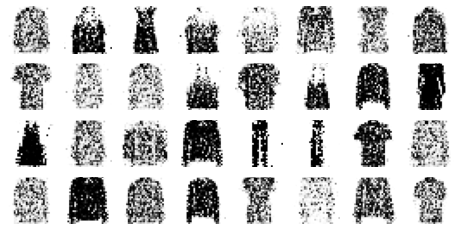

Epoch 17/50


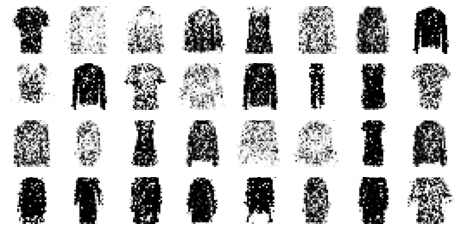

Epoch 18/50


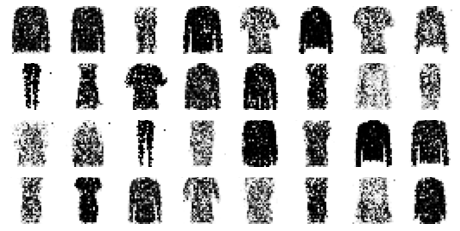

Epoch 19/50


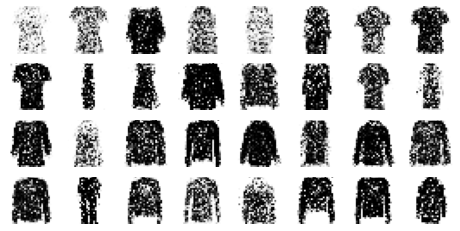

Epoch 20/50


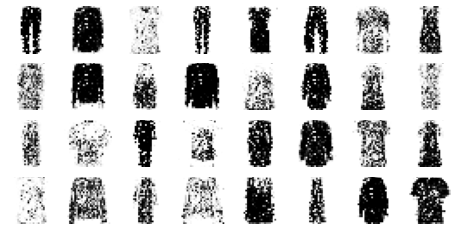

Epoch 21/50


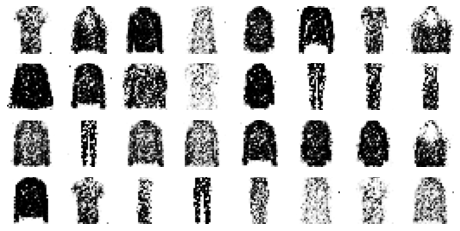

Epoch 22/50


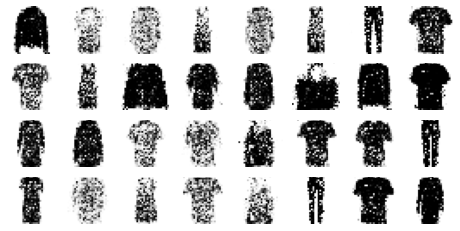

Epoch 23/50


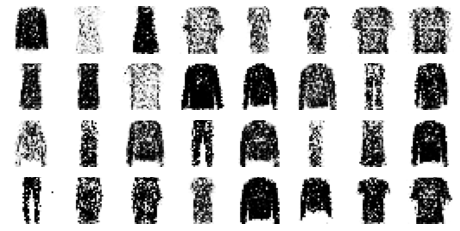

Epoch 24/50


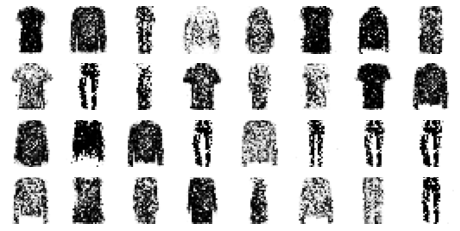

Epoch 25/50


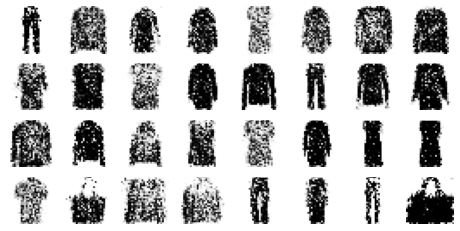

Epoch 26/50


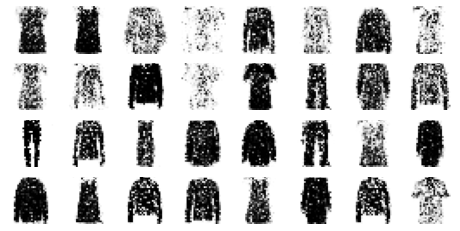

Epoch 27/50


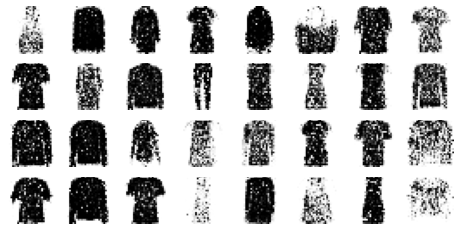

Epoch 28/50


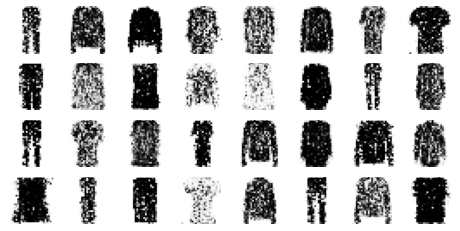

Epoch 29/50


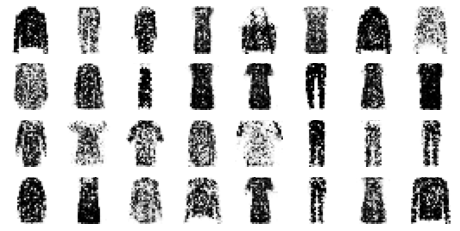

Epoch 30/50


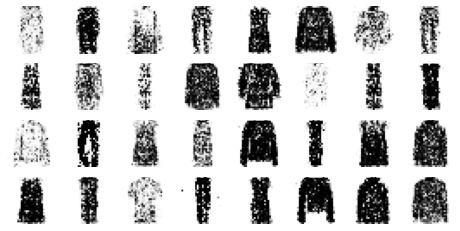

Epoch 31/50


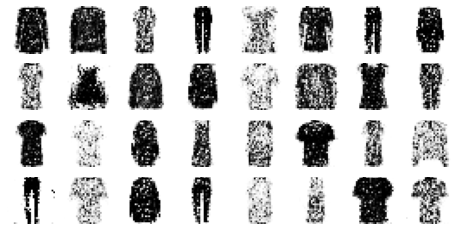

Epoch 32/50


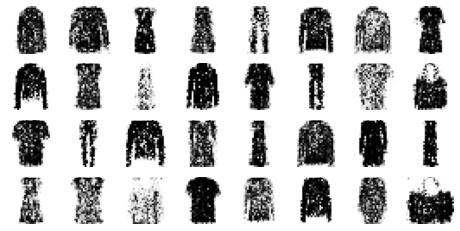

Epoch 33/50


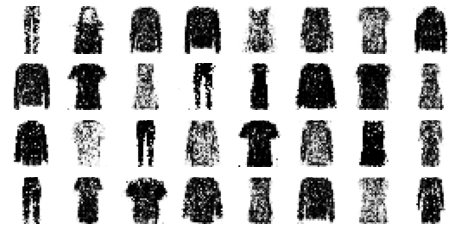

Epoch 34/50


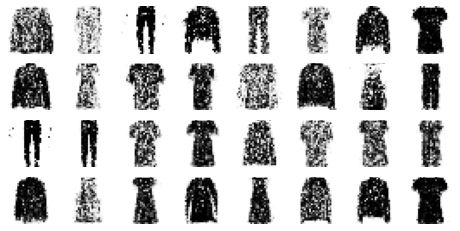

Epoch 35/50


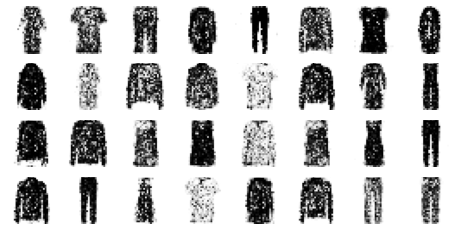

Epoch 36/50


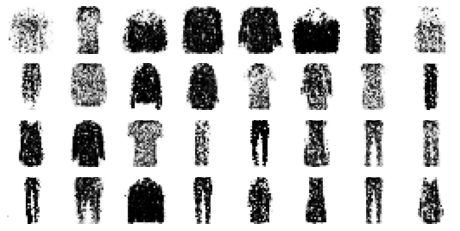

Epoch 37/50


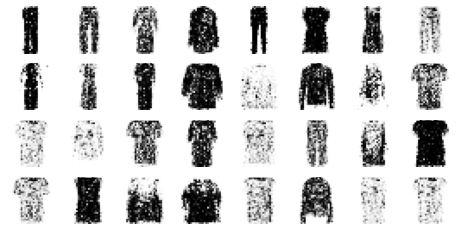

Epoch 38/50


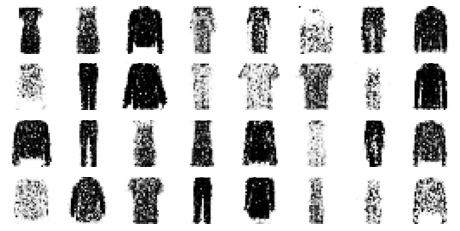

Epoch 39/50


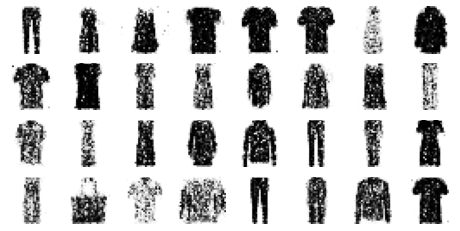

Epoch 40/50


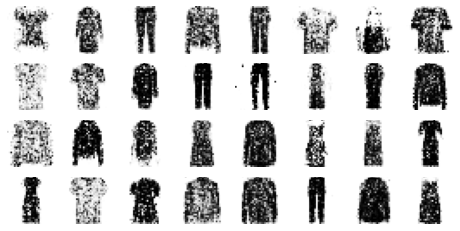

Epoch 41/50


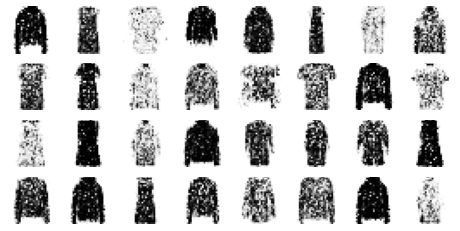

Epoch 42/50


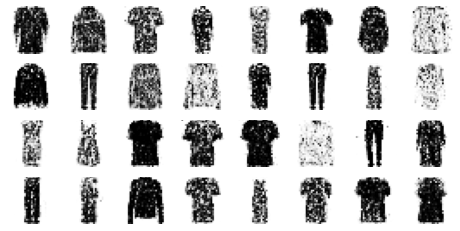

Epoch 43/50


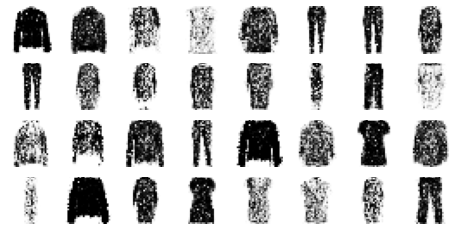

Epoch 44/50


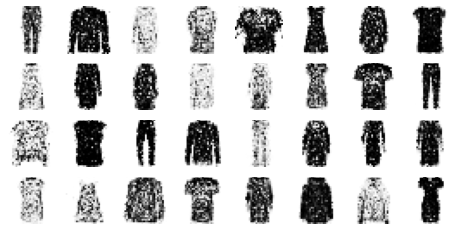

Epoch 45/50


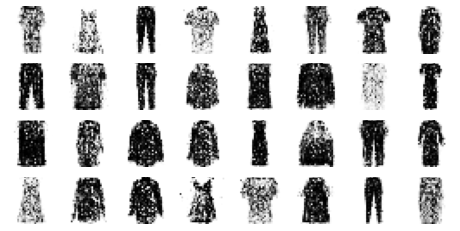

Epoch 46/50


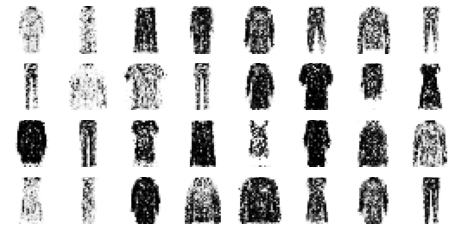

Epoch 47/50


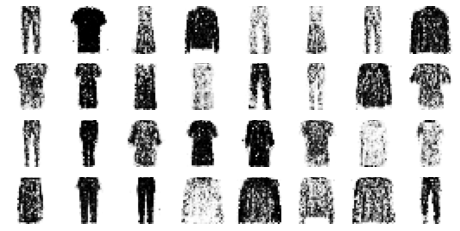

Epoch 48/50


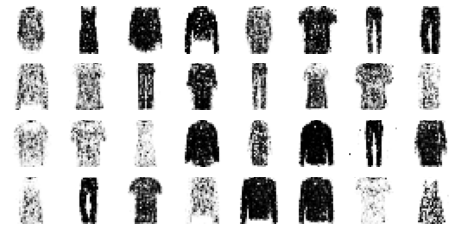

Epoch 49/50


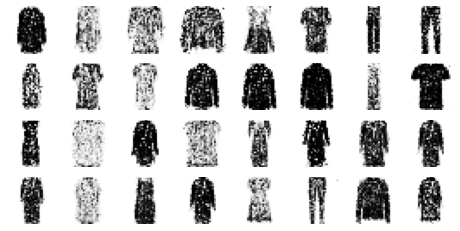

Epoch 50/50


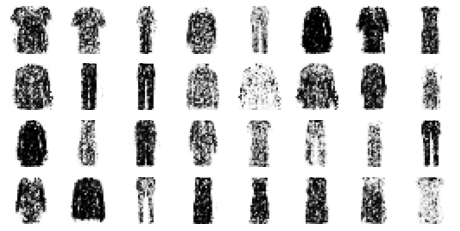

In [37]:
def listing10_0(data):
    np.random.seed(42)
    tf.random.set_seed(42)

    codings_size = 30

    generator = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
        keras.layers.Dense(150, activation="selu"),
        keras.layers.Dense(28 * 28, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    discriminator = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        keras.layers.Dense(150, activation="selu"),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    gan = keras.models.Sequential([generator, discriminator])


    discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
    discriminator.trainable = False
    gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

    batch_size = 32
    dataset = tf.data.Dataset.from_tensor_slices(data.X_train).shuffle(1000)
    dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

    train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

    tf.random.set_seed(42)
    np.random.seed(42)

    noise = tf.random.normal(shape=[batch_size, codings_size])
    generated_images = generator(noise)
    plot_multiple_images(generated_images, 8)
    plt.show()

    train_gan(gan, dataset, batch_size, codings_size)

listing10_0(data_mnist)

<a id='10.1'></a>
<a name="10.1"></a>
## 10.1 The Difficulties of Training GANS
<a href="#top">[back to top]</a>

No source code

<a id='10.2'></a>
<a name="10.2"></a>
## 10.2 Deep Convolutional GANs
<a href="#top">[back to top]</a>

Epoch 1/50


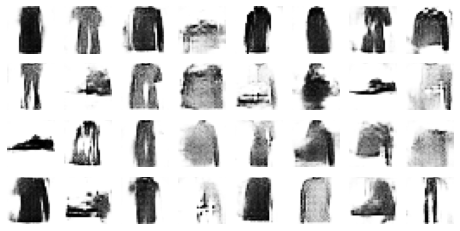

Epoch 2/50


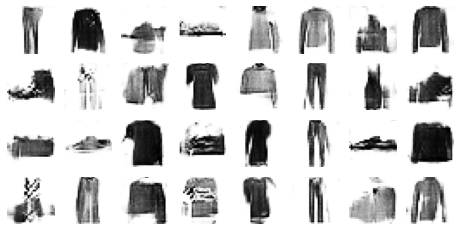

Epoch 3/50


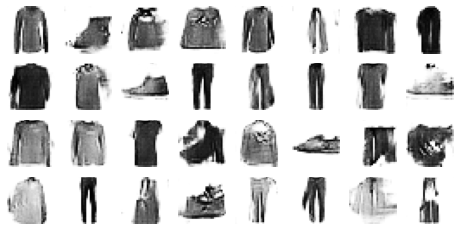

Epoch 4/50


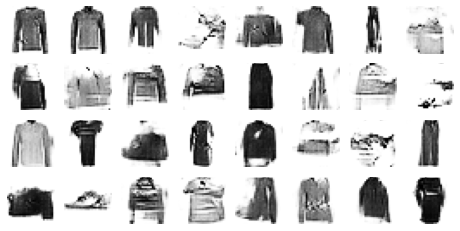

Epoch 5/50


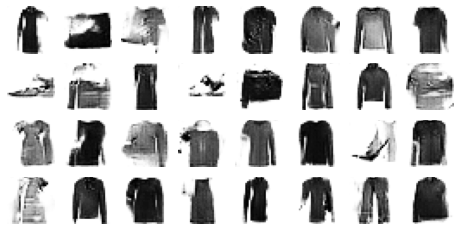

Epoch 6/50


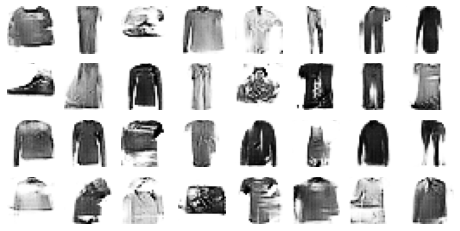

Epoch 7/50


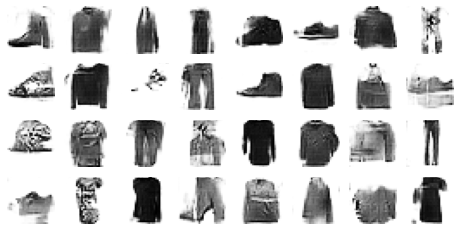

Epoch 8/50


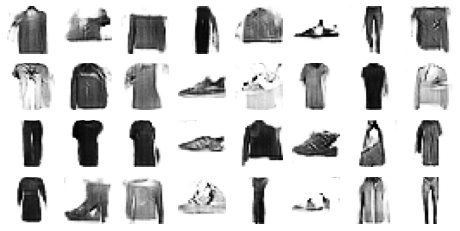

Epoch 9/50


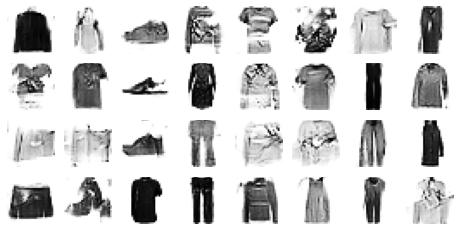

Epoch 10/50


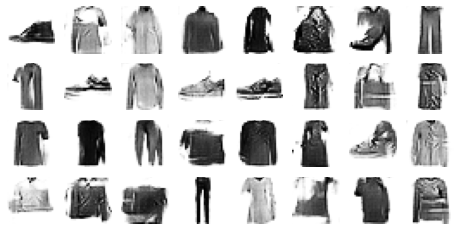

Epoch 11/50


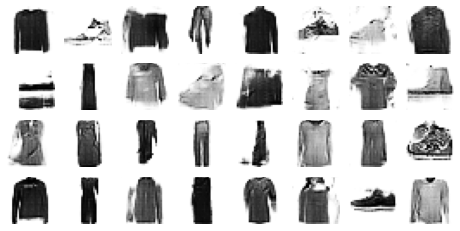

Epoch 12/50


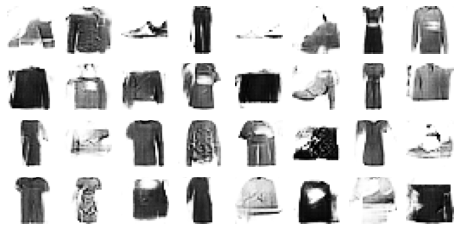

Epoch 13/50


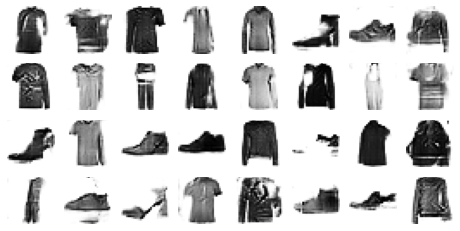

Epoch 14/50


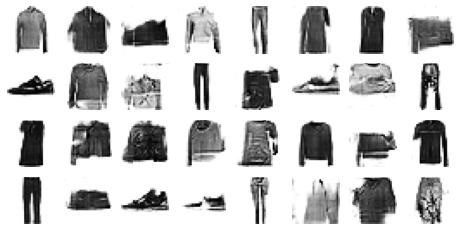

Epoch 15/50


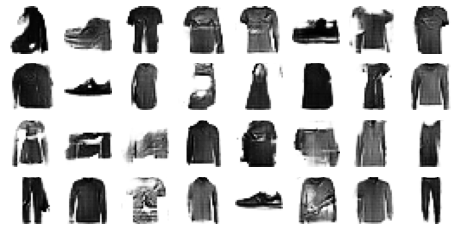

Epoch 16/50


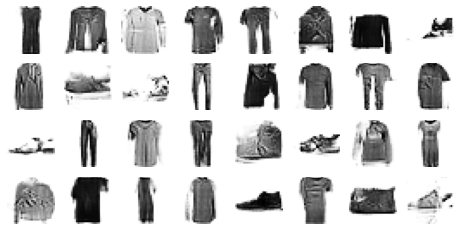

Epoch 17/50


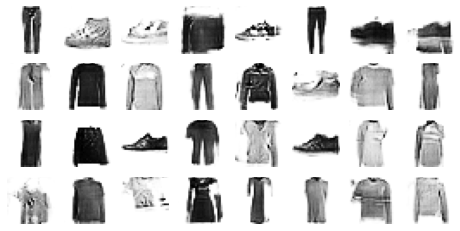

Epoch 18/50


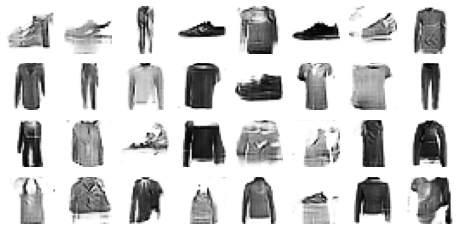

Epoch 19/50


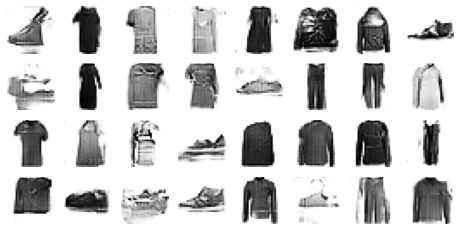

Epoch 20/50


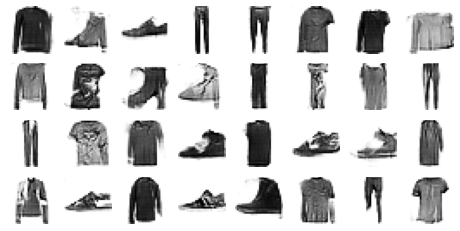

Epoch 21/50


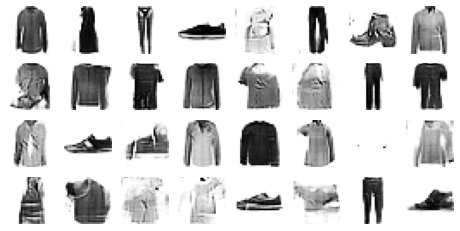

Epoch 22/50


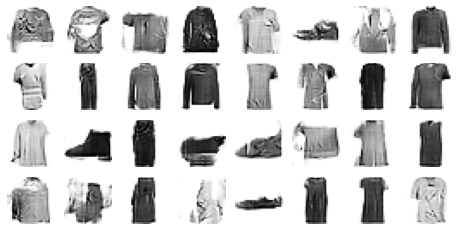

Epoch 23/50


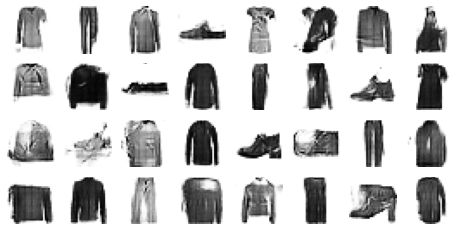

Epoch 24/50


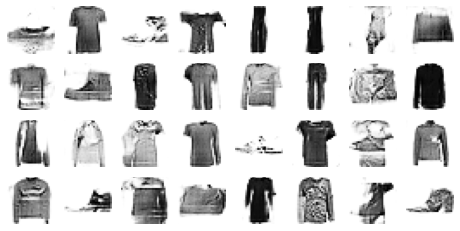

Epoch 25/50


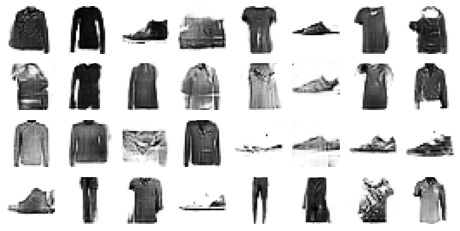

Epoch 26/50


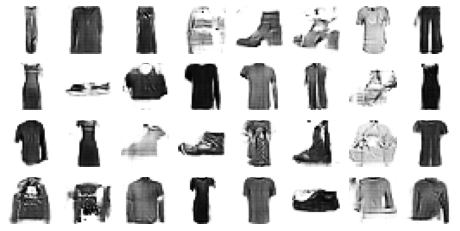

Epoch 27/50


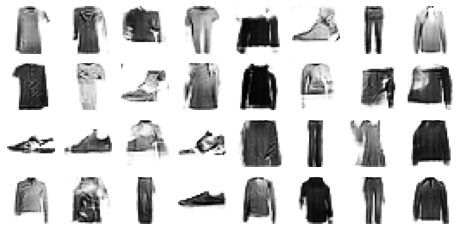

Epoch 28/50


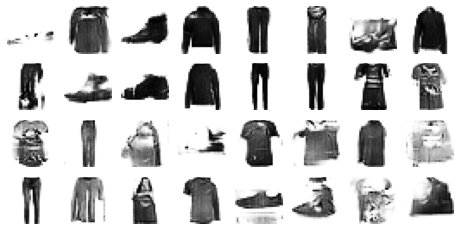

Epoch 29/50


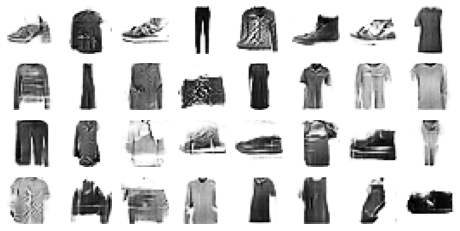

Epoch 30/50


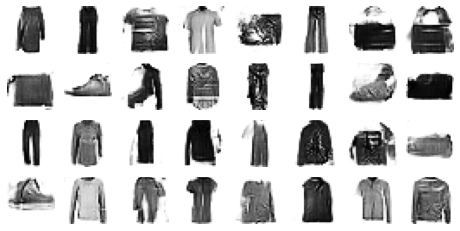

Epoch 31/50


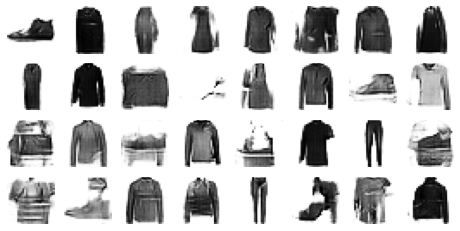

Epoch 32/50


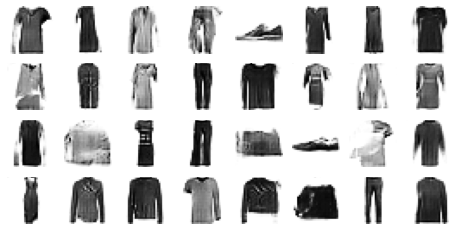

Epoch 33/50


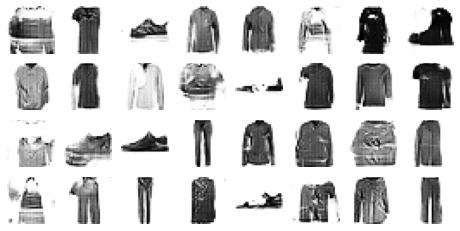

Epoch 34/50


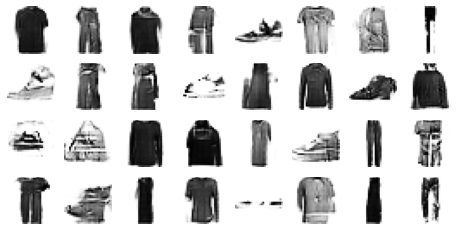

Epoch 35/50


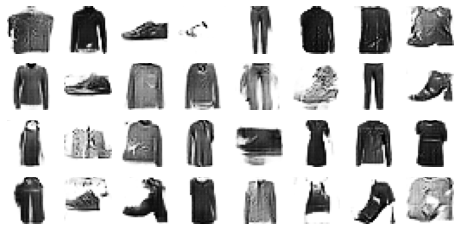

Epoch 36/50


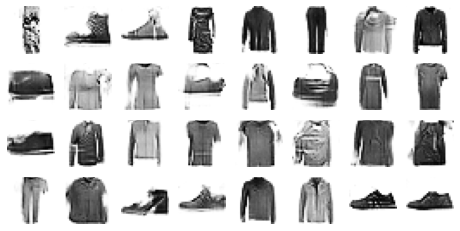

Epoch 37/50


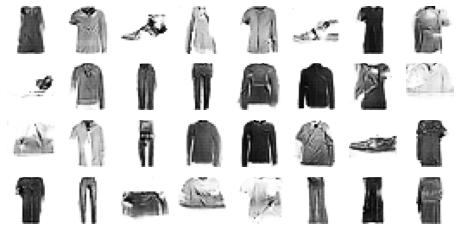

Epoch 38/50


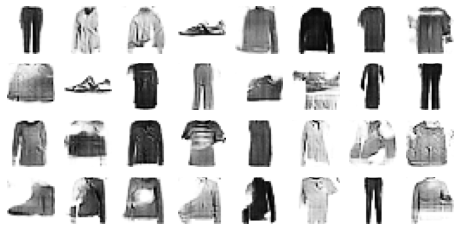

Epoch 39/50


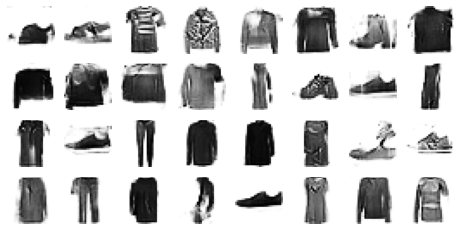

Epoch 40/50


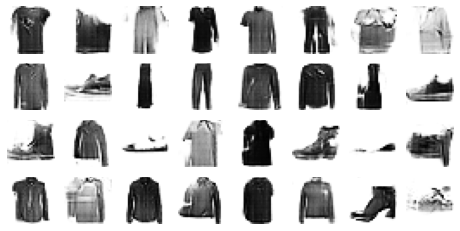

Epoch 41/50


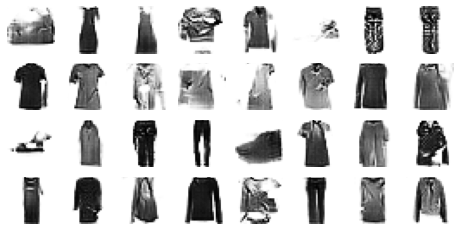

Epoch 42/50


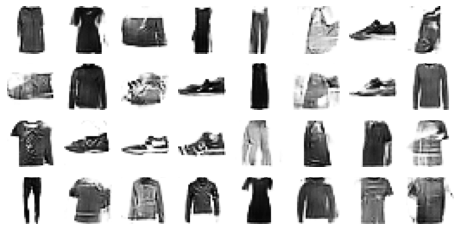

Epoch 43/50


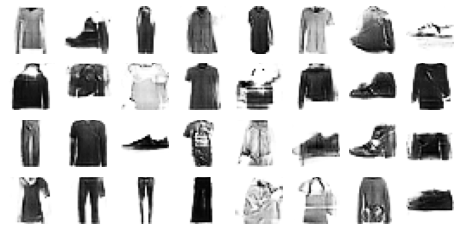

Epoch 44/50


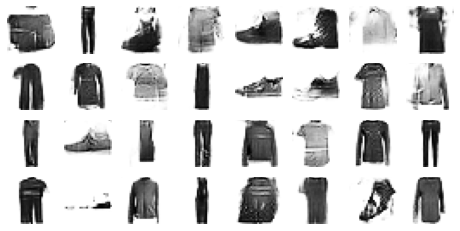

Epoch 45/50


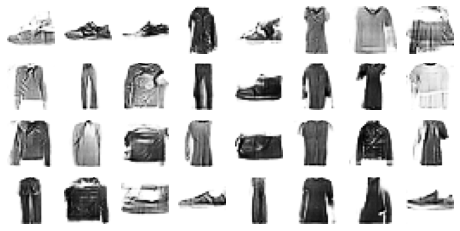

Epoch 46/50


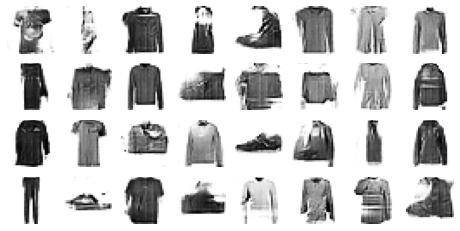

Epoch 47/50


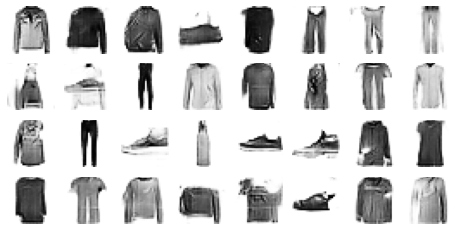

Epoch 48/50


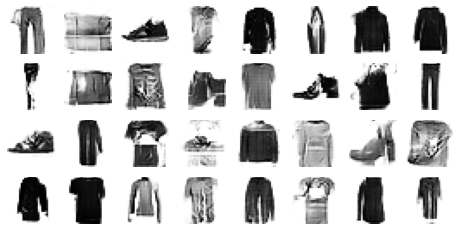

Epoch 49/50


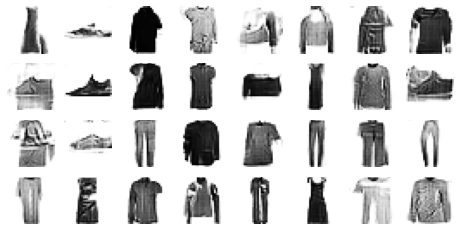

Epoch 50/50


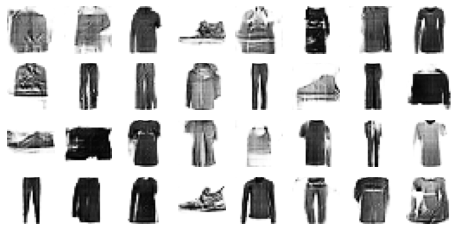

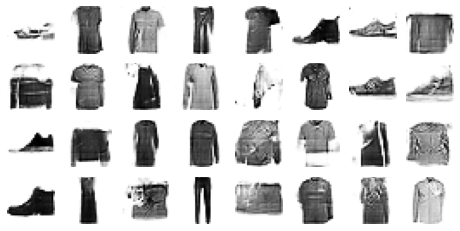

In [38]:
def listing10_2(data):

    tf.random.set_seed(42)
    np.random.seed(42)

    codings_size = 100

    generator = keras.models.Sequential([
        keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
        keras.layers.Reshape([7, 7, 128]),
        keras.layers.BatchNormalization(),
        keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME", activation="selu"),
        keras.layers.BatchNormalization(),
        keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME", activation="tanh"),
    ])
    discriminator = keras.models.Sequential([
        keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2), input_shape=[28, 28, 1]),
        keras.layers.Dropout(0.4),
        keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2)),
        keras.layers.Dropout(0.4),
        keras.layers.Flatten(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    gan = keras.models.Sequential([generator, discriminator])


    discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
    discriminator.trainable = False
    gan.compile(loss="binary_crossentropy", optimizer="rmsprop")


    X_train_dcgan = data.X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale


    batch_size = 32
    dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
    dataset = dataset.shuffle(1000)
    dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

    train_gan(gan, dataset, batch_size, codings_size)

    tf.random.set_seed(42)
    np.random.seed(42)

    noise = tf.random.normal(shape=[batch_size, codings_size])
    generated_images = generator(noise)
    plot_multiple_images(generated_images, 8)
    plt.show()

listing10_2(data_mnist)

<a id='10.3'></a>
<a name="10.3"></a>
## 10.3 Progressive Growing of GANS
<a href="#top">[back to top]</a>

No source code

<a id='10.4'></a>
<a name="10.4"></a>
## 10.4 StyleGANS
<a href="#top">[back to top]</a>

No source code



---
<a id='11.0'></a>
<a name="11.0"></a>
# 11. Extra Material
<a href="#top">[back to top]</a>

## Hashing Using a Binary Autoencoder

Use the Fashion MNIST dataset again.

Let's train an autoencoder where the encoder has a 16-neuron output layer, using the sigmoid activation function, and heavy Gaussian noise just before it. During training, the noise layer will encourage the previous layer to learn to output large values, since small values will just be crushed by the noise. In turn, this means that the output layer will output values close to 0 or 1, thanks to the sigmoid activation function. Once we round the output values to 0s and 1s, we get a 16-bit "semantic" hash. If everything works well, images that look alike will have the same hash. This can be very useful for search engines: for example, if we store each image on a server identified by the image's semantic hash, then all similar images will end up on the same server. Users of the search engine can then provide an image to search for, and the search engine will compute the image's hash using the encoder, and quickly return all the images on the server identified by that hash.

Epoch 1/10
1719/1719 - 8s - loss: 0.4053 - rounded_accuracy: 0.8155 - val_loss: 0.3876 - val_rounded_accuracy: 0.8232 - 8s/epoch - 4ms/step
Epoch 2/10
1719/1719 - 6s - loss: 0.3669 - rounded_accuracy: 0.8499 - val_loss: 0.3689 - val_rounded_accuracy: 0.8430 - 6s/epoch - 4ms/step
Epoch 3/10
1719/1719 - 7s - loss: 0.3565 - rounded_accuracy: 0.8600 - val_loss: 0.3614 - val_rounded_accuracy: 0.8535 - 7s/epoch - 4ms/step
Epoch 4/10
1719/1719 - 7s - loss: 0.3520 - rounded_accuracy: 0.8643 - val_loss: 0.3548 - val_rounded_accuracy: 0.8591 - 7s/epoch - 4ms/step
Epoch 5/10
1719/1719 - 6s - loss: 0.3482 - rounded_accuracy: 0.8682 - val_loss: 0.3488 - val_rounded_accuracy: 0.8698 - 6s/epoch - 4ms/step
Epoch 6/10
1719/1719 - 6s - loss: 0.3456 - rounded_accuracy: 0.8707 - val_loss: 0.3430 - val_rounded_accuracy: 0.8762 - 6s/epoch - 4ms/step
Epoch 7/10
1719/1719 - 6s - loss: 0.3434 - rounded_accuracy: 0.8735 - val_loss: 0.3426 - val_rounded_accuracy: 0.8777 - 6s/epoch - 4ms/step
Epoch 8/10
1719/1719

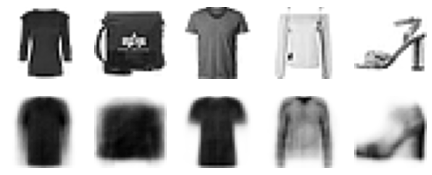

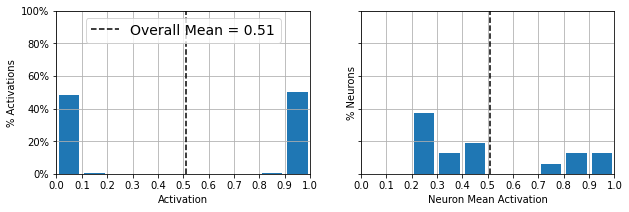

1110100100101000
1000110100101000
1101100100101000
0010111100000000
0000110101010000
...


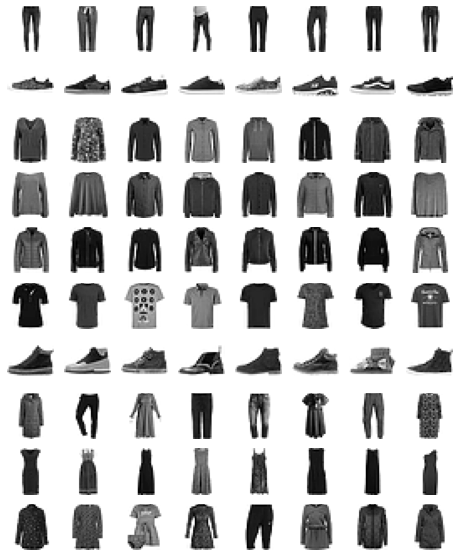

In [40]:
def listing11_0(data):
        
    tf.random.set_seed(42)
    np.random.seed(42)

    hashing_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[28, 28]),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.GaussianNoise(15.),
        keras.layers.Dense(16, activation="sigmoid"),
    ])
    hashing_decoder = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[16]),
        keras.layers.Dense(28 * 28, activation="sigmoid"),
        keras.layers.Reshape([28, 28])
    ])
    hashing_ae = keras.models.Sequential([hashing_encoder, hashing_decoder])
    
    hashing_ae.compile(
        loss="binary_crossentropy", 
        optimizer=keras.optimizers.Nadam(),
        metrics=[rounded_accuracy]
        )
    
    history = hashing_ae.fit(
        data.X_train, 
        data.X_train, 
        epochs=10,
        validation_data=(data.X_valid, data.X_valid),
        verbose=2
    )
    
    # The autoencoder compresses the information so much (down to 16 bits!) that it's quite lossy, but that's okay, we're using it to produce semantic hashes, not to perfectly reconstruct the images:
    show_reconstructions(hashing_ae)
    plt.show()


    # Notice that the outputs are indeed very close to 0 or 1 (left graph):
    plot_activations_histogram(hashing_encoder)
    plt.show()


    # Now let's see what the hashes look like for the first few images in the validation set:
    hashes = np.round(hashing_encoder.predict(data.X_valid)).astype(np.int32)
    hashes *= np.array([[2**bit for bit in range(16)]])
    hashes = hashes.sum(axis=1)
    for h in hashes[:5]:
        print("{:016b}".format(h))
    print("...")


    # Now let's find the most common image hashes in the validation set, and display a few images for each hash. In the following image, all the images on a given row have the same hash:
    from collections import Counter

    n_hashes = 10
    n_images = 8

    top_hashes = Counter(hashes).most_common(n_hashes)

    plt.figure(figsize=(n_images, n_hashes))
    for hash_index, (image_hash, hash_count) in enumerate(top_hashes):
        indices = (hashes == image_hash)
        for index, image in enumerate(data.X_valid[indices][:n_images]):
            plt.subplot(n_hashes, n_images, hash_index * n_images + index + 1)
            plt.imshow(image, cmap="binary")
            plt.axis("off")

listing11_0(data_mnist)